In [1]:
import os
import pathlib
from jiwer import wer, cer
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
annotation_folder = "./data/IAM_crop/annotations"
prediction_folder = "./results/IAM_crop/"


In [3]:
files = os.listdir(annotation_folder)
len(files)

1539

In [4]:
def post_process(hypothesis: str):
    return hypothesis.replace("\-","").replace("\\", " ")

In [5]:
CER = []
WER = []
for file in files:
    with open(os.path.join(annotation_folder, file), 'r') as f:
        reference = f.read()
    with open(os.path.join(prediction_folder, file), 'r') as f:
        hypothesis = f.read()
    hypothesis = post_process(hypothesis)
    WER.append(wer(reference, hypothesis))
    CER.append(cer(reference, hypothesis))

    

In [6]:
sum(WER)/len(WER), sum(CER)/len(CER), 

(0.10371081046062744, 0.05788871203939822)

## Visulaization

In [7]:
image_folder = "./data/IAM_crop/images"

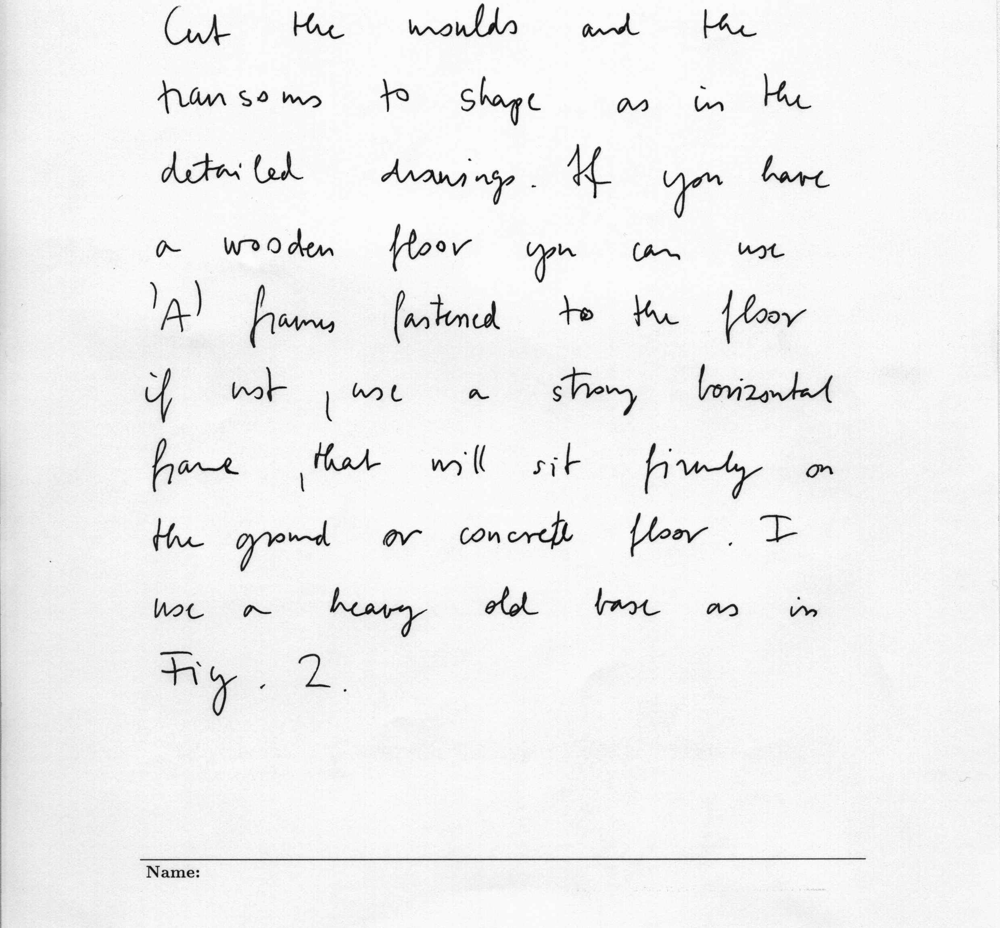

reference
Cut the moulds and the transoms to shape as in the detailed drawings. If you have a wooden floor you can use 'A' frames fastened to the floor if not, use a strong horizontal frame that will sit firmly on the ground or concrete floor. I use a heavy old base as in Fig. 2.
hypothesis
Cut the moulds and the transoms to shape as in the detailed drawings. If you have a wooden floor you can use 'A' frames fastened to the floor if not, use a strong horizontal frame, that will sit firmly on the ground or concrete floor. I use a heavy old base as in Fig. 2.
WER 0.01818181818181818
CER 0.003703703703703704


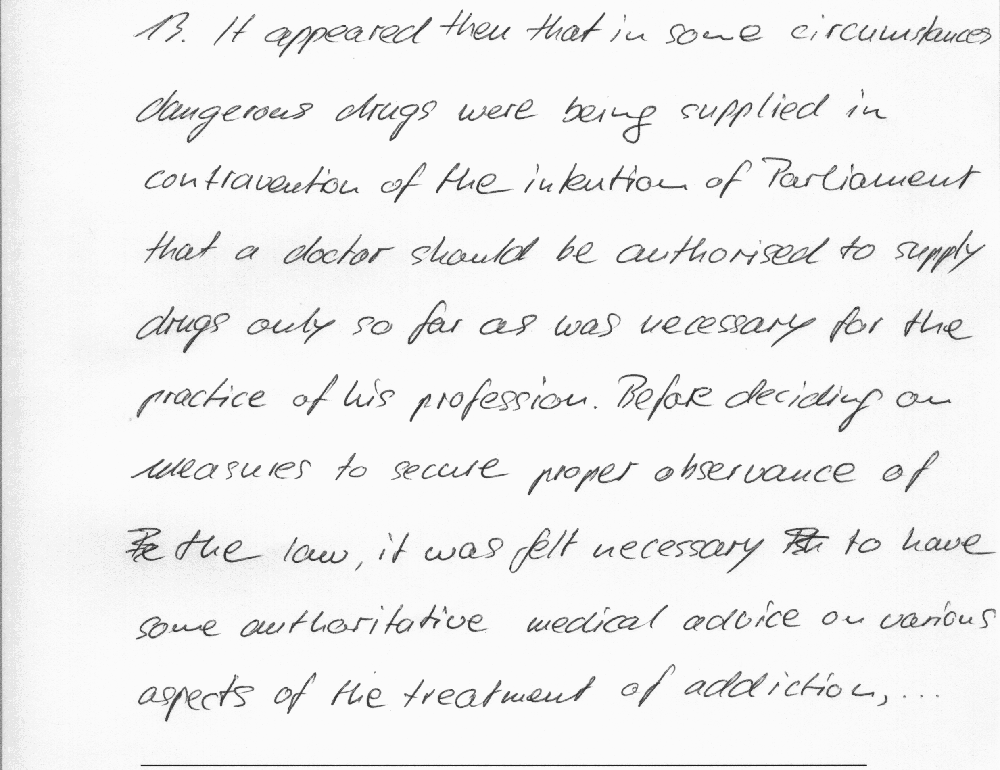

reference
13. It appeared then that in some circumstances dangerous drugs were being supplied in contravention of the intention of Parliament that a doctor should be authorised to supply drugs only so far as was necessary for the practice of his profession. Before deciding on measures to secure proper observance of the law, it was felt necessary to have some authoritative medical advice on various aspects of the treatment of addiction, the use of dangerous drugs in medical treatment, and the action which might be taken where a doctor appeared to have misused his authority to possess and supply them.
hypothesis
MR. It appeared then that in some circumstances dangerous drugs were being supplied in contravation of the intention of Parliament that a doctor should be authorised to supply drugs only so far as was necessary for the practice of his profession. Before deciding on measures to secure proper observance of # law, it was felt necessary to have some authoritative medical advice on va

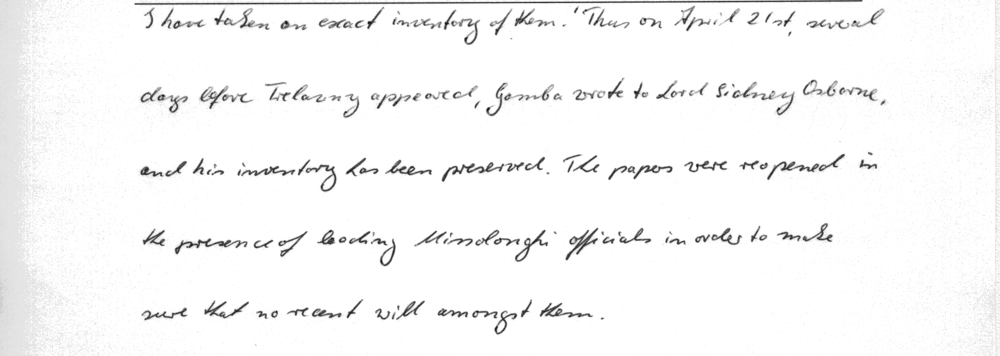

reference
I have taken an exact inventory of them.' Thus on April 21st, several days before Trelawny appeared, Gamba wrote to Lord Sidney Osborne, and his inventory has been preserved. The papers were reopened in the presence of leading Missolonghi officials in order to make sure that no recent will was amongst them.
hypothesis
I have taken an exact inventory of them. 'Thus on April 21st, several days before February appeared, Yamba wrote to Lord Sidney Osborne, and his inventory has been preserved. The papers were reopened in the presence of leading Ninsoloughi officials in order to make sure that no recent will amongst them.
WER 0.11538461538461539
CER 0.05519480519480519


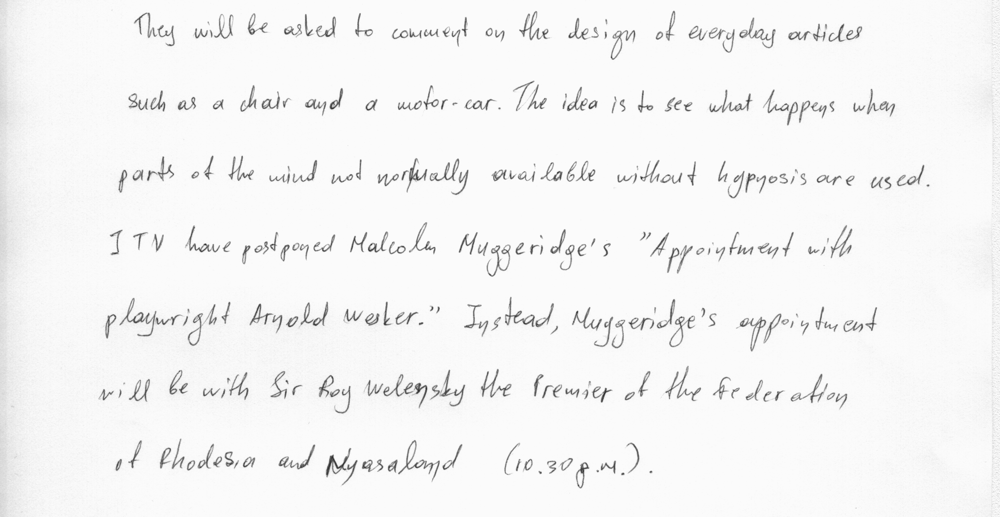

reference
They will be asked to comment on the design of everyday articles such as a chair and a motor-car. The idea is to see what happens when parts of the mind not normally available without hypnosis are used. I T V have postponed Malcolm Muggeridge's &quot;Appointment with playwright Arnold Wesker.&quot; Instead, Muggeridge's appointment will be with Sir Roy Welensky the Premier of the Federation of Rhodesia and Nyasa- land (10.30 p.m.).
hypothesis
They will be asked to comment on the design of everyday articles such as a chair and a motor-car. The idea is to see what happens when parts of the mind not normally available without happiness are used. I'M have postponed Malcolm Muggering's "Appointment with playwright Arnold Wocker." Instead, Muggering's appointment will be with Sir Roy Welensky the Premier of the Federation of Rhodesia and Nyasaland (10.30 p.m.).
WER 0.14084507042253522
CER 0.06666666666666667


In [8]:
count = 0
for file in files:
    with open(os.path.join(annotation_folder, file), 'r') as f:
        reference = f.read()
    with open(os.path.join(prediction_folder, file), 'r') as f:
        hypothesis = f.read()
    if not any(chr.isdigit() for chr in reference): 
        continue
    if count > 3:
        break
    img = Image.open(os.path.join(image_folder, file.replace("txt","png")))
    hypothesis = post_process(hypothesis)
    display(img)
    print("reference")
    print(reference)
    print("hypothesis")
    print(hypothesis)
    print("WER",wer(reference, hypothesis))
    print("CER",cer(reference, hypothesis))
    count += 1